In [1]:
!pip install vectorbt pandas numpy talib-binary


ERROR: Ignored the following versions that require a different python version: 0.15.0 Requires-Python >=3.6, <3.9; 0.15.1 Requires-Python >=3.6, <3.9; 0.15.2 Requires-Python >=3.6, <3.9; 0.15.3 Requires-Python >=3.6, <3.9; 0.15.4 Requires-Python >=3.6, <3.9; 0.15.5 Requires-Python >=3.6, <3.9; 0.15.6 Requires-Python >=3.6, <3.9; 0.15.7 Requires-Python >=3.6, <3.9; 0.16.0 Requires-Python >=3.6, <3.9; 0.16.1 Requires-Python >=3.6, <3.9; 0.16.2 Requires-Python >=3.6, <3.9; 0.16.3 Requires-Python >=3.6, <3.9; 0.16.4 Requires-Python >=3.6, <3.9; 0.16.5 Requires-Python >=3.6, <3.9; 0.16.6 Requires-Python >=3.6, <3.9; 0.17.0 Requires-Python >=3.6, <3.9; 0.17.1 Requires-Python >=3.6, <3.9; 0.17.2 Requires-Python >=3.6, <3.9; 0.17.3 Requires-Python >=3.6, <3.9; 0.17.4 Requires-Python >=3.6, <3.9; 0.17.5 Requires-Python >=3.6, <3.9; 0.17.6 Requires-Python >=3.6, <3.10; 0.17.7 Requires-Python >=3.6, <3.10; 0.18.0 Requires-Python >=3.6, <3.10; 0.18.1 Requires-Python >=3.6, <3.10; 0.18.2 Requires-P

In [3]:
from google.colab import files
uploaded = files.upload()
filename = list(uploaded.keys())[0]

import pandas as pd
import numpy as np

df = pd.read_csv(filename)
df = df[df['Volume'] != 0].reset_index(drop=True)

df['RSI'] = df['Close'].rolling(12).apply(lambda x: (x.diff()>0).sum()/12*100)
df['EMA'] = df['Close'].ewm(span=150).mean()

tr = np.maximum(df['High'] - df['Low'],
                np.maximum(abs(df['High'] - df['Close'].shift()),
                           abs(df['Low'] - df['Close'].shift())))
df['ATR'] = tr.rolling(14).mean()


Saving EURUSD_Candlestick_1_Hour_BID_04.05.2003-15.04.2023.csv to EURUSD_Candlestick_1_Hour_BID_04.05.2003-15.04.2023.csv


In [4]:
window = 5

roll_max = df['High'].rolling(2*window+1, center=True).max()
roll_min = df['Low'].rolling(2*window+1, center=True).min()

df['pivot_high'] = (df['High'] == roll_max).astype(int)
df['pivot_low']  = (df['Low']  == roll_min).astype(int)


In [5]:
ph_idx = df['pivot_high'].replace(0,np.nan).ffill().astype('Int64')
pl_idx = df['pivot_low'].replace(0,np.nan).ffill().astype('Int64')

last_ph = df['High'].where(df['pivot_high']==1).ffill()
last_pl = df['Low'].where(df['pivot_low']==1).ffill()

bull = (df['Close'] > last_ph.shift()) & (df['Low'] < last_pl.shift())
bear = (df['Close'] < last_pl.shift()) & (df['High'] > last_ph.shift())

df['breakout_signal'] = np.where(bull,2, np.where(bear,1,0))


In [8]:
pip install vectorbt

  Using cached vectorbt-0.28.1-py3-none-any.whl.metadata (12 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.7/527.7 kB 26.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.5/315.5 kB 28.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 78.1 MB/s eta 0:00:00


In [9]:
import vectorbt as vbt

entries_long  = df['breakout_signal'] == 2
entries_short = df['breakout_signal'] == 1

# Stop loss and take-profit levels
sl_p = df['ATR'] * 1.5
tp_p = df['ATR'] * 1.5 * 1

close = df['Close']

portfolio = vbt.Portfolio.from_signals(
    close,
    entries_long,
    entries_short,
    sl_stop = close - sl_p,
    tp_stop = close + tp_p,
    size = 0.99
)


In [10]:
portfolio.stats()


/usr/local/lib/python3.12/dist-packages/vectorbt/generic/stats_builder.py:396: UserWarning: Metric 'sharpe_ratio' requires frequency to be set
  warnings.warn(warning_message)
/usr/local/lib/python3.12/dist-packages/vectorbt/generic/stats_builder.py:396: UserWarning: Metric 'calmar_ratio' requires frequency to be set
  warnings.warn(warning_message)
/usr/local/lib/python3.12/dist-packages/vectorbt/generic/stats_builder.py:396: UserWarning: Metric 'omega_ratio' requires frequency to be set
  warnings.warn(warning_message)
/usr/local/lib/python3.12/dist-packages/vectorbt/generic/stats_builder.py:396: UserWarning: Metric 'sortino_ratio' requires frequency to be set
  warnings.warn(warning_message)


,0
Start,0.000000
End,123840.000000
Period,123841.000000
Start Value,100.000000
End Value,99.404753
Total Return [%],-0.595247
Benchmark Return [%],-2.121900
Max Gross Exposure [%],1.583966
Total Fees Paid,0.000000
Max Drawdown [%],0.878675


In [11]:
atr_range = np.arange(0.5, 5.1, 0.5)
tpsl_range = np.arange(0.5, 5.1, 0.5)

def run_param(atr_mult, tp_mult):
    sl = df['ATR'] * atr_mult
    tp = df['ATR'] * atr_mult * tp_mult
    pf = vbt.Portfolio.from_signals(
        df['Close'],
        entries_long,
        entries_short,
        sl_stop = df['Close'] - sl,
        tp_stop = df['Close'] + tp
    )
    return pf.total_return()

results = np.zeros((len(atr_range), len(tpsl_range)))

for i, a in enumerate(atr_range):
    for j, t in enumerate(tpsl_range):
        results[i,j] = run_param(a,t)


In [12]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Candlestick(
    x=df.index,
    open=df['Open'],
    high=df['High'],
    low=df['Low'],
    close=df['Close'],
    name='Price'
))

# breakout markers
fig.add_trace(go.Scatter(
    x=df.index[df['breakout_signal']==2],
    y=df['Close'][df['breakout_signal']==2],
    mode='markers',
    marker=dict(color='green', size=7, symbol='triangle-up'),
    name='Bullish Breakout'
))

fig.add_trace(go.Scatter(
    x=df.index[df['breakout_signal']==1],
    y=df['Close'][df['breakout_signal']==1],
    mode='markers',
    marker=dict(color='red', size=7, symbol='triangle-down'),
    name='Bearish Breakout'
))

fig.update_layout(title='EUR/USD Candlestick with Breakout Signals', height=600)
fig.show()


In [13]:
portfolio.plot().show()


<Axes: title={'center': 'ATR (Volatility Regime)'}>

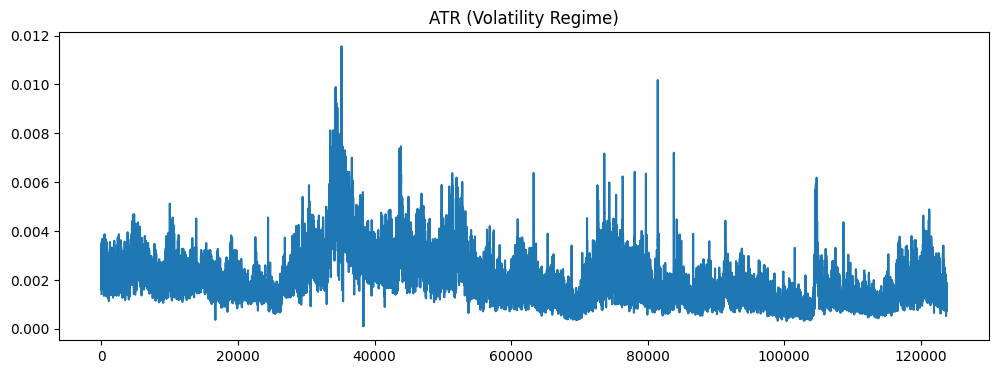

In [14]:
df['ATR'].plot(figsize=(12,4), title='ATR (Volatility Regime)')


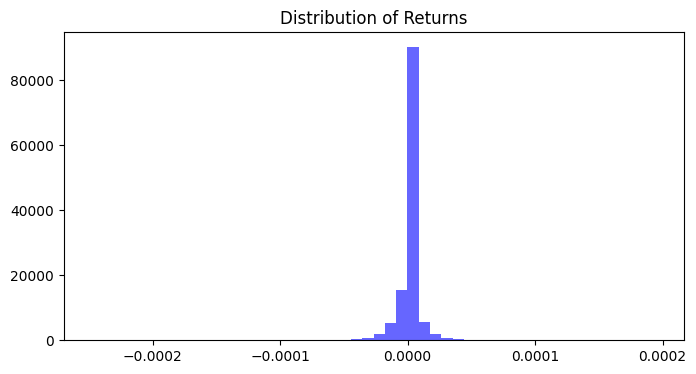

In [16]:
import matplotlib.pyplot as plt

rets = portfolio.returns()

plt.figure(figsize=(8,4))
plt.hist(rets, bins=50, color='blue', alpha=0.6)
plt.title('Distribution of Returns')
plt.show()
